In [1]:
import json
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

import glob
import cv2
import re

from pycocotools.coco import COCO

## Data Preparation

Function to sorting data

In [2]:
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

Function to ceating name from labels

In [3]:
def create_name_labels(path):
    name_all = sorted(glob.glob("{}/*.txt".format(path)) , key=numericalSort)
    name_txt = [x.split("/")[-1] for x in name_all]
    name = [x.split(".txt")[0] for x in name_txt]
    return name

Function to ceating name for images

In [4]:
def create_name_img(path):
    name_all = sorted(glob.glob("{}/*.txt".format(path)) , key=numericalSort)
    name_txt = [x.split("/")[-1] for x in name_all]
    name = [x.split(".txt")[0] for x in name_txt]
    names = [x.split("-")[0] for x in name]
    return names

## Creating images with new names for Locandon

In [58]:
names_labels = create_name_labels("dane/LACANDON_img_lbl/labels")
len(names_labels)

26

In [59]:
names_img = create_name_img("dane/LACANDON_img_lbl/labels")
len(names_img)

26

In [43]:
for x,y in zip(names_img,names_labels):
    img = cv2.imread("dane/LACANDON/{}.jpg".format(x))
    cv2.imwrite("dane/LACANDON_img_lbl/img_without_frame/{}.jpg".format(y), img)

## Creating images with new names for Reduccion

In [9]:
names_labels = create_name_labels("REDUCCION/labels")
len(names_labels)

89

In [16]:
names_labels[:4]

['SRD_C_09932_0011-reduccion',
 'SRD_C_09932_0013-reduccion',
 'SRD_C_09932_0014-reduccion',
 'SRD_C_09932_0015-reduccion']

In [10]:
names_img = create_name_img("REDUCCION/labels")
len(names_img)

89

In [15]:
names_img[:4]

['SRD_C_09932_0011',
 'SRD_C_09932_0013',
 'SRD_C_09932_0014',
 'SRD_C_09932_0015']

In [17]:
for x,y in zip(names_img,names_labels):
    img = cv2.imread("REDUCCION/connected_wframe/{}.jpg".format(x))
    cv2.imwrite("REDUCCION/connected_newname_img/{}.jpg".format(y), img)

# Images and crop images for Locandon

### Loading images with bbox from YOLO format

In [34]:
def load_img_with_bbox(path_img, path_lab):
    
    img = cv2.imread("dane/LACANDON_img_lbl/img_without_frame/{}.jpg".format(path_img))
    dh, dw, _ = img.shape
    fl = open("dane/LACANDON_img_lbl/labels/{}.txt".format(path_lab), "r")
    bbox = fl.readlines()
    fl.close()
    
    for dt in bbox:

        _, x, y, w, h = map(float, dt.split(' '))

        l = int((x - w / 2) * dw)
        r = int((x + w / 2) * dw)
        t = int((y - h / 2) * dh)
        b = int((y + h / 2) * dh)
    
        if l < 0:
            l = 0
        if r > dw - 1:
            r = dw - 1
        if t < 0:
            t = 0
        if b > dh - 1:
            b = dh - 1

        cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 5)
    
    plt.figure(figsize=(20,25))
    plt.imshow(img)
    plt.show()

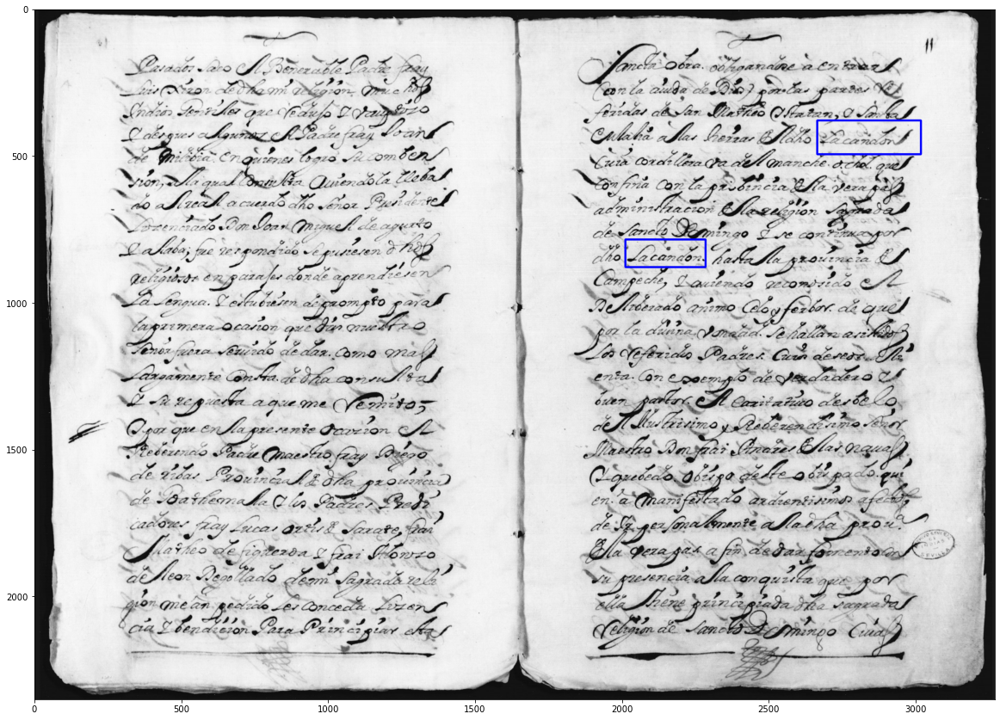

In [35]:
load_img_with_bbox("SRD_C_09932_0020-Lacandon", "SRD_C_09932_0020-Lacandon")

### Crop images by bounding box

In [36]:
def crop_img(path_img, path_lab):
    
    img = cv2.imread("dane/LACANDON_img_lbl/img_without_frame/{}.jpg".format(path_img))
    dh, dw, _ = img.shape
    fl = open("dane/LACANDON_img_lbl/labels/{}.txt".format(path_lab), "r")
    bbox = fl.readlines()
    fl.close()
    
    for dt in bbox:

        _, x, y, w, h = map(float, dt.split(' '))

        l = int((x - w / 2) * dw)
        r = int((x + w / 2) * dw)
        t = int((y - h / 2) * dh)
        b = int((y + h / 2) * dh)
    
        crop_img = img[t:b, l:r]
    
        plt.imshow(crop_img)
        plt.show()

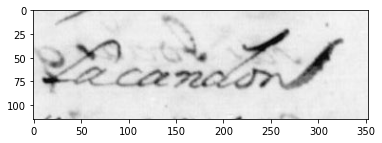

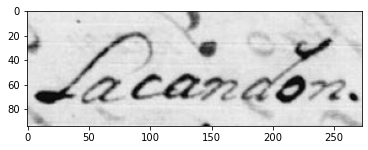

In [37]:
crop_img("SRD_C_09932_0020-Lacandon", "SRD_C_09932_0020-Lacandon")

### Example for a few images

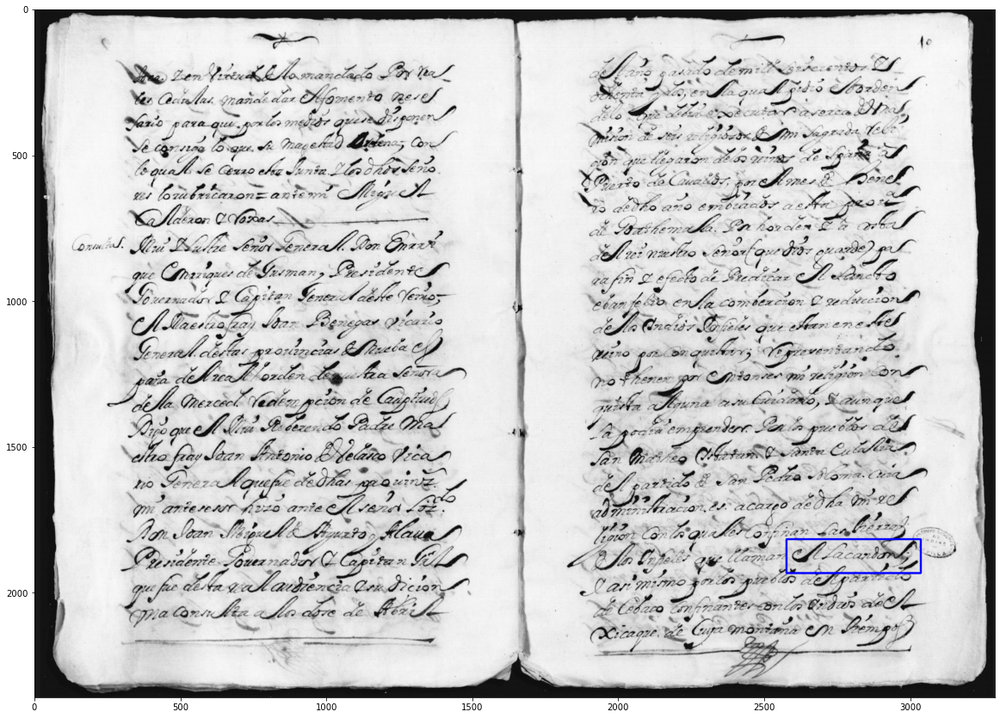

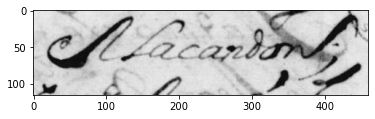

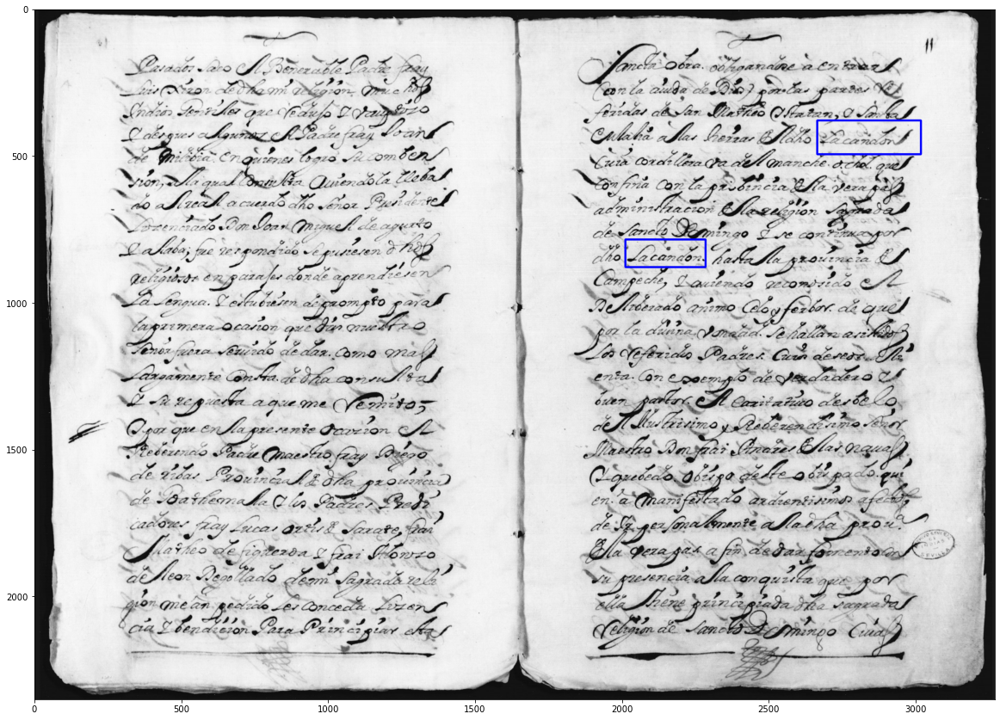

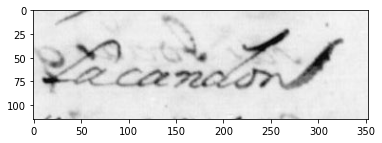

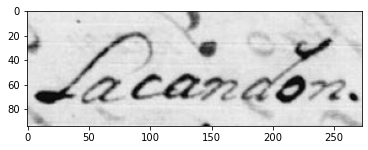

...

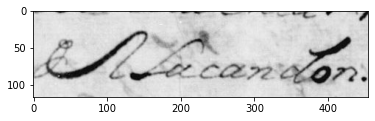

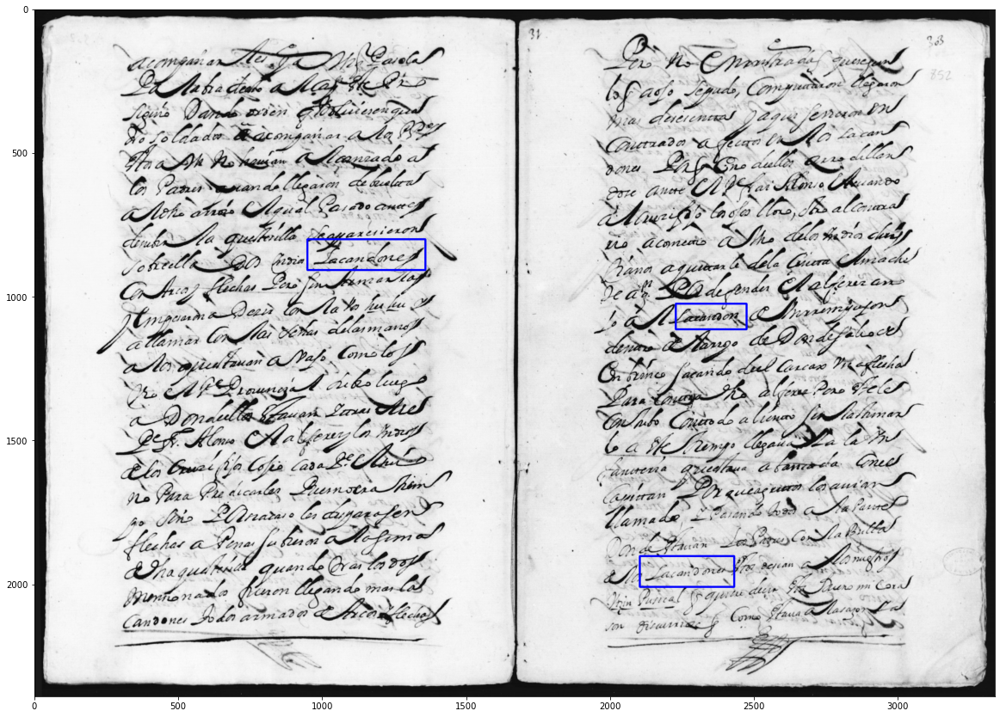

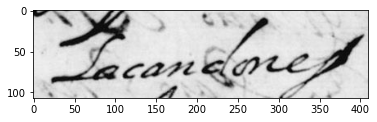

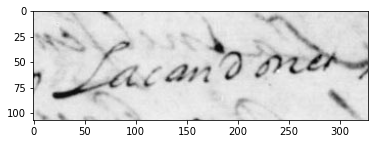

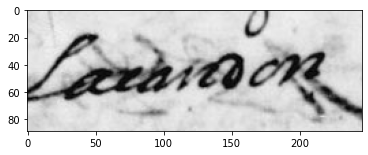

In [51]:
for x in names_labels[:4]:
    load_img_with_bbox(x, x)
    crop_img(x, x)

# Images and crop images for Reduccion

### Loading images with bbox from YOLO format

In [61]:
def load_img_with_bbox(path_img, path_lab):
    
    img = cv2.imread("dane/REDUCCION/img_without_frame/{}.jpg".format(path_img))
    dh, dw, _ = img.shape
    fl = open("dane/REDUCCION/labels/{}.txt".format(path_lab), "r")
    bbox = fl.readlines()
    fl.close()
    
    for dt in bbox:

        _, x, y, w, h = map(float, dt.split(' '))

        l = int((x - w / 2) * dw)
        r = int((x + w / 2) * dw)
        t = int((y - h / 2) * dh)
        b = int((y + h / 2) * dh)
    
        if l < 0:
            l = 0
        if r > dw - 1:
            r = dw - 1
        if t < 0:
            t = 0
        if b > dh - 1:
            b = dh - 1

        cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 5)
    
    plt.figure(figsize=(20,25))
    plt.imshow(img)
    plt.show()

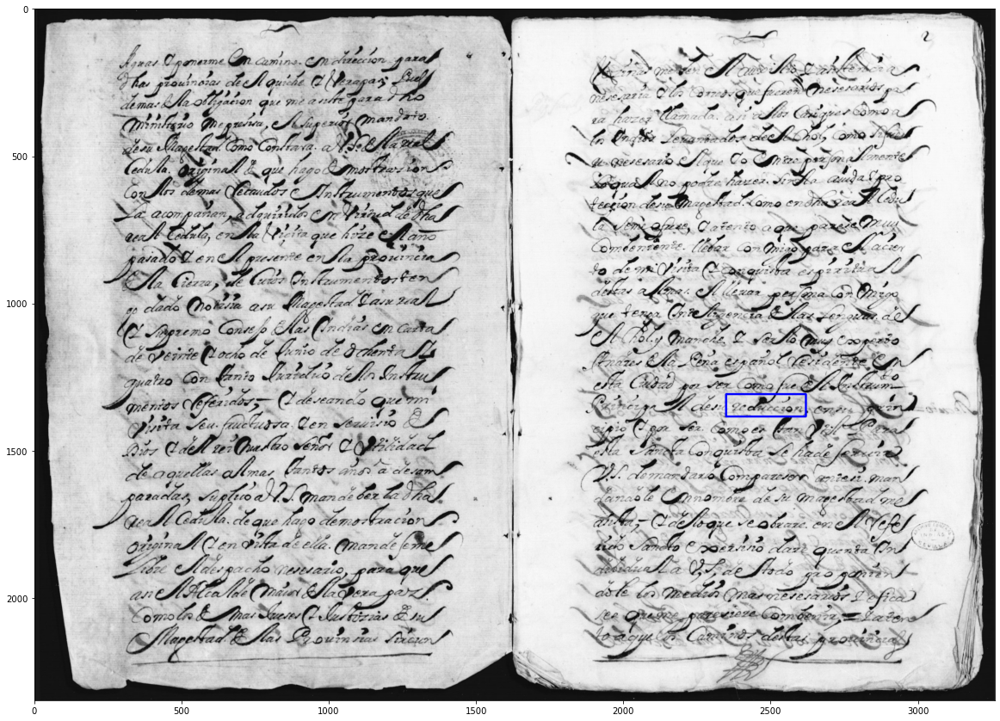

In [63]:
load_img_with_bbox("SRD_C_09932_0011-reduccion", "SRD_C_09932_0011-reduccion")

### Crop images by bounding box

In [65]:
def crop_img(path_img, path_lab):
    
    img = cv2.imread("dane/REDUCCION/img_without_frame/{}.jpg".format(path_img))
    dh, dw, _ = img.shape
    fl = open("dane/REDUCCION/labels/{}.txt".format(path_lab), "r")
    bbox = fl.readlines()
    fl.close()
    
    for dt in bbox:

        _, x, y, w, h = map(float, dt.split(' '))

        l = int((x - w / 2) * dw)
        r = int((x + w / 2) * dw)
        t = int((y - h / 2) * dh)
        b = int((y + h / 2) * dh)
    
        crop_img = img[t:b, l:r]
    
        plt.imshow(crop_img)
        plt.show()

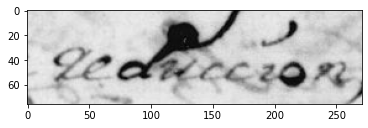

In [66]:
crop_img("SRD_C_09932_0011-reduccion", "SRD_C_09932_0011-reduccion")

### Example for a few images

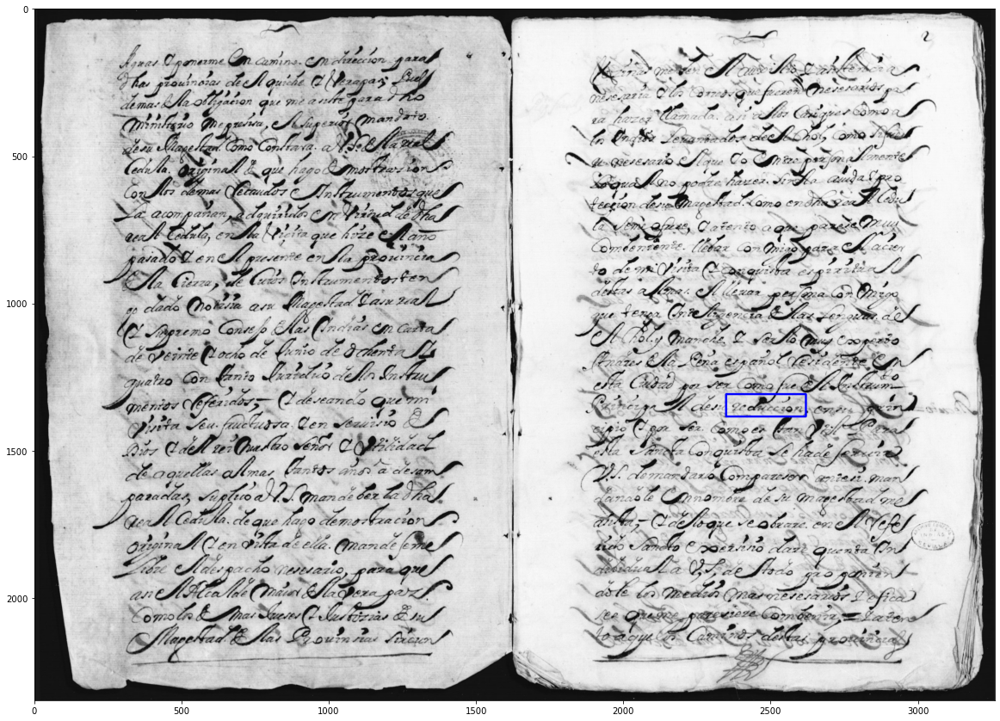

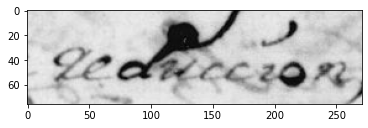

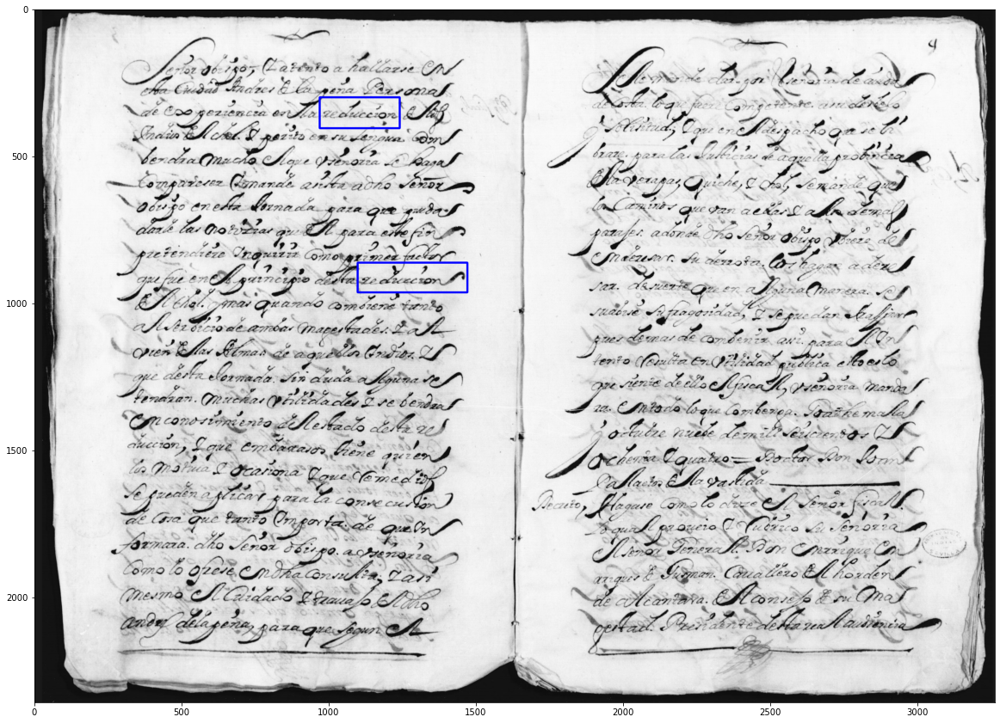

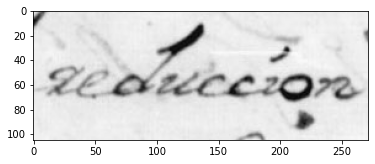

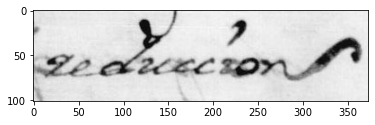

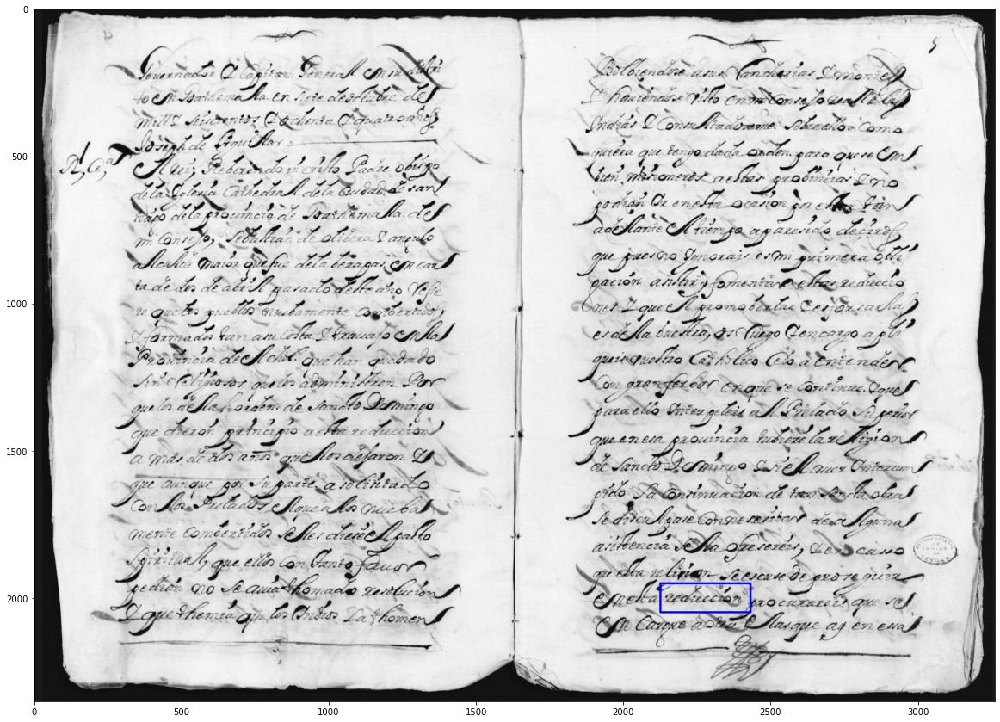

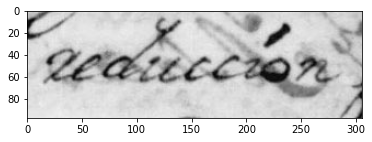

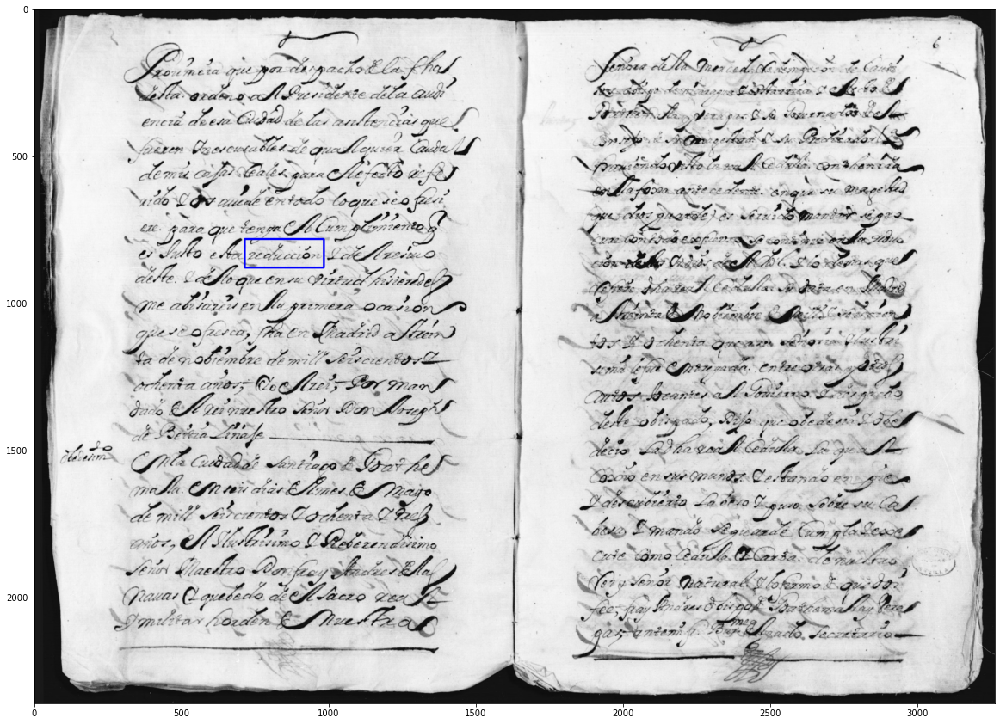

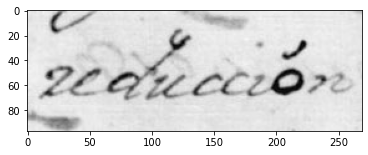

In [68]:
for x in names_labels[:4]:
    load_img_with_bbox(x, x)
    crop_img(x, x)